In [40]:
import torch
import torchvision.transforms as transforms
import torchvision.models as models
from PIL import Image
import matplotlib.pyplot as plt
import numpy as np
import operator, math, os, glob
import torch.nn as nn
from matplotlib.pyplot import imread

import timm
from torchvision import transforms

from torchvision.datasets import ImageFolder
from torch.utils.data import DataLoader

import os
os.environ["KMP_DUPLICATE_LIB_OK"] = "TRUE"


In [2]:
def euclidean_distance(vec1, vec2) :
  distance = np.linalg.norm(vec1 - vec2)
  return distance

In [73]:
# def getkVoisins(features_dict, query_name, k):
#   query_feature = features_dict[query_name]
#   distances = []
#   for name, feature_vector in features_dict.items():
#     dist = euclidean_distance(query_feature, feature_vector)
#     distances.append((name,dist))
#   #print(distances)
#   distances.sort(key=lambda x: x[1])
#   return distances[:k]

def getkVoisins(features_dict,querry, k=5):
    """
    Find k nearest neighbors to a query (by name or vector) in the given features_dict.

    Parameters:
        features_dict: dict {image_name: feature_vector}
        query_name: the name of the image in the dict (optional if query_vector is provided)
        query_vector: the query vector (optional if query_name is provided)
        k: number of neighbors to retrieve

    Returns:
        list of (name, distance) tuples
    """
    
    distances = []
    for name, feature_vector in features_dict.items():
        dist = euclidean_distance(querry, feature_vector)
        distances.append((name, dist))

    distances.sort(key=lambda x: x[1])
    return distances[:k]

In [4]:
import requests
import zipfile
import os
import shutil


if os.path.exists("MIR_DATASETS_B"):
    print("Le dossier existe déjà.")
else:
    # URL du fichier zip
    url = "https://github.com/sidimahmoudi/facenet_tf2/releases/download/AI_MIR_CLOUD/MIR_DATASETS_B.zip"

    # Nom du fichier zip local
    fichier_zip = "MIR_DATASETS_B.zip"

    # Dossier d'extraction
    dossier_extraction = "MIR_DATASETS_B"

    # 1. Supprimer l'ancien dossier s'il existe
    if os.path.exists(dossier_extraction):
        print(f"Suppression de l'ancien dossier : {dossier_extraction}")
        shutil.rmtree(dossier_extraction)

    # 2. Télécharger le fichier zip
    print("Téléchargement en cours...")
    response = requests.get(url, stream=True)
    with open(fichier_zip, 'wb') as f:
        shutil.copyfileobj(response.raw, f)
    print("Téléchargement terminé.")

    # 3. Extraire le fichier zip
    print("Extraction en cours...")
    with zipfile.ZipFile(fichier_zip, 'r') as zip_ref:
        zip_ref.extractall(dossier_extraction)
    print(f"Extraction terminée dans le dossier : {dossier_extraction}")

    # 4. (Optionnel) Supprimer le fichier zip
    os.remove(fichier_zip)
    print("Fichier zip supprimé.")
    

    # Chemin vers le dossier à supprimer
    dossier_a_supprimer = 'MIR_DATASETS_B/MIR_DATASETS_B/araignees'

    # Vérifie si le dossier existe avant de le supprimer
    if os.path.exists(dossier_a_supprimer):
        shutil.rmtree(dossier_a_supprimer)
        print("Dossier supprimé avec succès.")
    else:
        print("Le dossier n'existe pas.")


Le dossier existe déjà.


In [41]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu") #prend GPU si disponible sinon cpu


#charge modèle ViT pour avoir un vision transformer
feature_extractor = timm.create_model('vit_base_patch16_224', pretrained=True)
feature_extractor.reset_classifier(0)  # Remove classification head to get pure features
feature_extractor.eval()
feature_extractor.to(device)

# feature_extractor = models.vgg16(pretrained=True)
# feature_extractor.eval()  # Mode évaluation
# device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
# feature_extractor.to(device)


VisionTransformer(
  (patch_embed): PatchEmbed(
    (proj): Conv2d(3, 768, kernel_size=(16, 16), stride=(16, 16))
    (norm): Identity()
  )
  (pos_drop): Dropout(p=0.0, inplace=False)
  (patch_drop): Identity()
  (norm_pre): Identity()
  (blocks): Sequential(
    (0): Block(
      (norm1): LayerNorm((768,), eps=1e-06, elementwise_affine=True)
      (attn): Attention(
        (qkv): Linear(in_features=768, out_features=2304, bias=True)
        (q_norm): Identity()
        (k_norm): Identity()
        (attn_drop): Dropout(p=0.0, inplace=False)
        (proj): Linear(in_features=768, out_features=768, bias=True)
        (proj_drop): Dropout(p=0.0, inplace=False)
      )
      (ls1): Identity()
      (drop_path1): Identity()
      (norm2): LayerNorm((768,), eps=1e-06, elementwise_affine=True)
      (mlp): Mlp(
        (fc1): Linear(in_features=768, out_features=3072, bias=True)
        (act): GELU(approximate='none')
        (drop1): Dropout(p=0.0, inplace=False)
        (norm): Identity(

In [42]:
input_folder = "MIR_DATASETS_B/MIR_DATASETS_B"
output_folder = "ViT_descriptor"                 
os.makedirs(output_folder, exist_ok=True)  # Créer le dossier s'il n'existe pas
# transform = transforms.Compose([
#     transforms.Resize((224, 224)),  # Taille standard de VGG16
#     transforms.ToTensor(),
#     transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
# ])

#paramètre de ViT
transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize(mean=(0.5, 0.5, 0.5), std=(0.5, 0.5, 0.5))
])

In [43]:
def extract_features(image_path):
    image = Image.open(image_path).convert("RGB")
    image = transform(image).unsqueeze(0).to(device)
    with torch.no_grad():
        features = feature_extractor(image)
    return features.cpu().numpy().squeeze().flatten()



In [44]:
#EXTRACTION DES FEATURES
import os
import numpy as np


for classe in os.listdir(input_folder):
    classe_path = os.path.join(input_folder, classe)
    if not os.path.isdir(classe_path):
        continue
    print(classe)

    for sub_classe in os.listdir(classe_path):
        sub_classe_path = os.path.join(classe_path, sub_classe)
        if not os.path.isdir(sub_classe_path):
            continue
        print(sub_classe)

        for filename in os.listdir(sub_classe_path):
            if filename.lower().endswith(".jpg"):
                image_path = os.path.join(sub_classe_path, filename)
                features = extract_features(image_path)

                # Crée le même sous-dossier dans output_folder
                output_subfolder = os.path.join(output_folder, classe, sub_classe)
                os.makedirs(output_subfolder, exist_ok=True)

                output_path = os.path.join(output_subfolder, filename.split('.')[0])
                np.save(output_path, features)

                print(f"Features extraites et enregistrées : {output_path}")

print("Indexation terminée")


chiens
boxer
Features extraites et enregistrées : ViT_descriptor\chiens\boxer\1_2_chiens_boxer_1108
Features extraites et enregistrées : ViT_descriptor\chiens\boxer\1_2_chiens_boxer_1109
Features extraites et enregistrées : ViT_descriptor\chiens\boxer\1_2_chiens_boxer_1110
Features extraites et enregistrées : ViT_descriptor\chiens\boxer\1_2_chiens_boxer_1111
Features extraites et enregistrées : ViT_descriptor\chiens\boxer\1_2_chiens_boxer_1112
Features extraites et enregistrées : ViT_descriptor\chiens\boxer\1_2_chiens_boxer_1113
Features extraites et enregistrées : ViT_descriptor\chiens\boxer\1_2_chiens_boxer_1114
Features extraites et enregistrées : ViT_descriptor\chiens\boxer\1_2_chiens_boxer_1115
Features extraites et enregistrées : ViT_descriptor\chiens\boxer\1_2_chiens_boxer_1116
Features extraites et enregistrées : ViT_descriptor\chiens\boxer\1_2_chiens_boxer_1117
Features extraites et enregistrées : ViT_descriptor\chiens\boxer\1_2_chiens_boxer_1118
Features extraites et enregist

In [153]:

def load_features_with_images(feature_folder, text_feature_folder, image_folder):
    # Récupère tous les fichiers .txt dans tous les sous-dossiers
    feature_files = sorted(glob.glob(os.path.join(feature_folder, "**", "*.npy"), recursive=True))
    feature_text_files = sorted(glob.glob(os.path.join(text_feature_folder, "**", "*.npy"), recursive=True))
    feature_text_dict = {}
    features_dict = {}
    image_dict = {}
    text_dict = {}

    with open('captions_MIR_DATASETS_B.json', 'r') as f:
        text_complet = json.load(f)

    for file in feature_files:
        feature_vector = np.load(file)
        base_name = os.path.splitext(os.path.basename(file))[0]

        # Stocker les features
        features_dict[base_name] = feature_vector

        # Recherche de l'image correspondante (même sous-structure que features)
        rel_path = os.path.relpath(file, feature_folder)  # ex: classe/sub_classe/nom.txt
        rel_image_path = os.path.splitext(rel_path)[0] 
        rel_image_path = rel_image_path.removesuffix(".txt")+ ".jpg"  # classe/sub_classe/nom.jpg
        # print(rel_image_path)
        # print(base_name)

        text_dict[base_name] = text_complet[rel_image_path]
        
        image_path = os.path.join(image_folder, rel_image_path)

        if os.path.exists(image_path):
            image_dict[base_name] = image_path
        else:
            print(f"Aucune image trouvée pour {file} (attendu : {image_path})")
    
    for file in feature_text_files:
        feature_vector = np.load(file)
        base_name = os.path.splitext(os.path.basename(file))[0]

        # Stocker les features
        feature_text_dict[base_name] = feature_vector

        # Recherche de l'image correspondante (même sous-structure que features)
        rel_path = os.path.relpath(file, feature_folder)  # ex: classe/sub_classe/nom.txt
        rel_image_path = os.path.splitext(rel_path)[0] 
        rel_image_path = rel_image_path.removesuffix(".npy")+ ".jpg"  # classe/sub_classe/nom.jpg
        # print(rel_image_path)
        image_path = os.path.join(image_folder, rel_image_path)

        # if os.path.exists(image_path):
        #     if base_name not in image_dict:
        #         image_dict[base_name] = image_path #ajote si connait pas
        #         print("added new image")
        # else:
        #     print(f"Aucune image trouvée pour {file} {image_path}")

    print(f"{len(features_dict)} caractéristiques chargées avec images depuis {feature_folder}")
    print(f"{len(feature_text_dict)} caractéristiques chargées pour text avec images depuis {text_feature_folder}")

    features_mixed_dict = {}
    for key in features_dict:
        if key in feature_text_dict:
            features_mixed_dict[key] = np.hstack([features_dict[key]/np.linalg.norm(features_dict[key]), feature_text_dict[key]/np.linalg.norm(feature_text_dict[key])]) #mets image puis text pour faire la recherche multimodal

    first_key = next(iter(features_mixed_dict))
    shape = features_mixed_dict[first_key].shape
    

    return (features_dict, feature_text_dict, features_mixed_dict), image_dict, text_dict

In [154]:
features_dicts, image_dict, text_dict = load_features_with_images(output_folder,"text_descriptor", input_folder)

# print(features_dict.keys())
# print(features_text_dict.keys())
# print(features_mixed_dict.keys())

KeyError: 'chiens\\Chihuahua\\1_3_chiens_Chihuahua_1264.jpg'

In [140]:
if model_text is None:
    model_text = SentenceTransformer('sentence-transformers/all-MiniLM-L6-v2') #import le modele

def recherche(features_dicts, image_dict,image_path = None, text = None, top=9):
    selected_request = -1
    image_embedding = None
    text_embedding = None

    if image_path is not None:
        selected_request += 1
        print("image_path", image_path)
        image_embedding = extract_features(image_path)  #récupère les features de l'image requête

    if text is not None:
        selected_request += 2
        print("text", text)
        text_embedding = model_text.encode(text)  # recupère l'embeding du text

    #prend en comtpte si ils n ont pas les même dimensions
    if image_embedding is not None and text_embedding is None:
        embedding = image_embedding
    elif image_embedding is None and text_embedding is not None:
        embedding = text_embedding
    else:
        embedding = np.hstack([image_embedding/np.linalg.norm(image_embedding), text_embedding/np.linalg.norm(text_embedding)]) #concatène les deux embeddings


    print("Final embedding shape:", embedding.shape)

    # Get an element from the selected features dictionary and print its embedding size
    first_key = next(iter(features_dicts[selected_request]))
    print("Selected request:", selected_request)
    print("Sample key:", first_key)
    print("Embedding shape for this key:", features_dicts[selected_request][first_key].shape)

    


    voisins = getkVoisins(features_dicts[selected_request], embedding, k=top) #passe le bon dictionnaire en fonction de ce qu'on veut faire


    nom_images_proches = [image_dict[v[0]] for v in voisins if v[0] in image_dict]
    if selected_request == 0 or selected_request == 2:
    # Récupérer les chemins des images similaires
        # Affichage de l'image requête
        plt.figure(figsize=(5, 5))
        plt.imshow(imread(image_path), cmap='gray', interpolation='none')
        plt.title("Image requête")
        nom_image_requete = os.path.basename(image_path)
        print(f"Image requête : {nom_image_requete}")


    # Affichage des images proches
    plt.figure(figsize=(25, 50))
    plt.subplots_adjust(hspace=0.1, wspace=0.1)
    num_rows = int(math.ceil(top / 3))  # 3 subplots per row
    num_cols = min(top, 3)
    for j in range(min(top, len(nom_images_proches))):
        plt.subplot(num_rows, num_cols, j + 1)
        nom_images_short = nom_images_proches[j].split("/")[-1]
        plt.imshow(imread(nom_images_proches[j]), cmap='gray', interpolation='none')
        plt.title(f"Image proche n°{j} {nom_images_short}")

    plt.show()
    if selected_request == 1:
        return text, nom_images_proches
    return nom_image_requete, nom_images_proches


image_path MIR_DATASETS_B/MIR_DATASETS_B/chiens/boxer/1_2_chiens_boxer_1111.jpg
text two dogs playing in the snow
Final embedding shape: (1152,)
Selected request: 2
Sample key: 1_3_chiens_Chihuahua_1264
Embedding shape for this key: (1152,)
Image requête : 1_2_chiens_boxer_1111.jpg


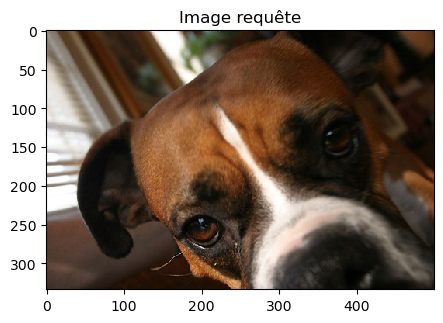

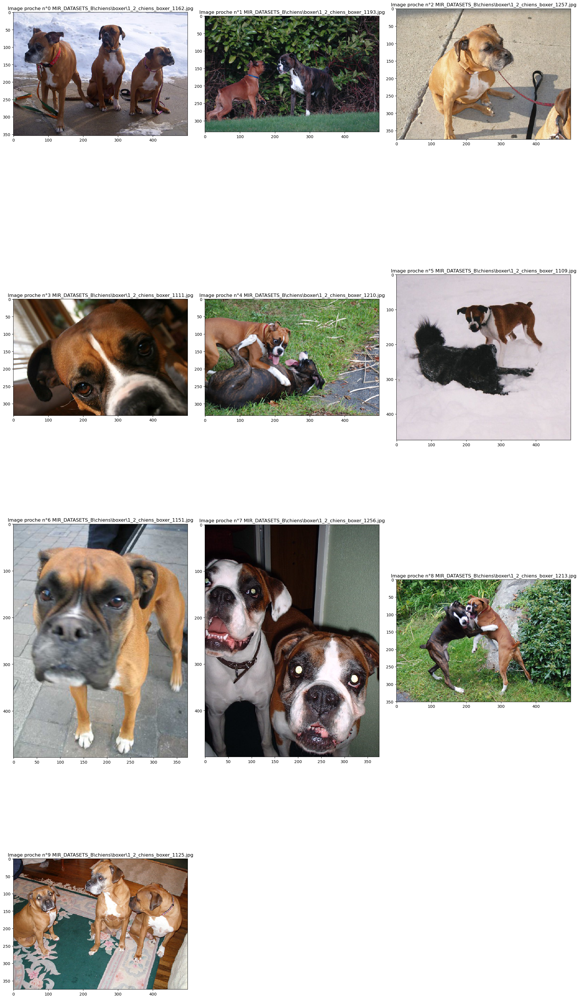

In [146]:
img = "MIR_DATASETS_B/MIR_DATASETS_B/chiens/boxer/1_2_chiens_boxer_1111.jpg"
# img=None
text = "two dogs playing in the snow"
# text = None
nom_image_requete, nom_images_proches = recherche(features_dicts, image_dict, image_path=img, text=text, top=10)

In [13]:
def Compute_RP( top, nom_image_requete, images_proches,race = True):

    rappel_precision = []
    rp = []
    position1 = os.path.splitext(os.path.basename(nom_image_requete))[0]

    if race :
        position1 = position1.split("_")[3]
    else :
        position1 = position1.split("_")[2]
    for j in range(top):
        position2 = os.path.splitext(os.path.basename(images_proches[j]))[0]

        if race:
            position2 = position2.split("_")[3]
        else:
            position2 = position2.split("_")[2]
        print("position 1 ", position1)
        print("position 2 ", position2)
        if position1 == position2:
            rappel_precision.append("pertinent")
            print("pertinent")
        else:
            rappel_precision.append("non pertinent")
            print("non pertinent")

    val = 0  # Nombre d'images pertinentes accumulées
    for i in range(top):
        if rappel_precision[i] == "pertinent":
            val += 1
        precision = val / (i + 1)
        rappel = val / top
        rp.append(f"{precision} {rappel}")  # Stocker les valeurs
    RP_file = str(os.path.splitext(os.path.basename(nom_image_requete))[0]) + 'RP.txt'
    #  Sauvegarde dans un fichier texte
    with open(RP_file, 'w') as s:
        for a in rp:
            s.write(str(a) + '\n')
    print(f"✅ RP enregistré dans {RP_file}")


In [14]:
Compute_RP(10, nom_image_requete, nom_images_proches,race = False)

position 1  chiens
position 2  chiens
pertinent
position 1  chiens
position 2  singes
non pertinent
position 1  chiens
position 2  chiens
pertinent
position 1  chiens
position 2  poissons
non pertinent
position 1  chiens
position 2  oiseaux
non pertinent
position 1  chiens
position 2  oiseaux
non pertinent
position 1  chiens
position 2  poissons
non pertinent
position 1  chiens
position 2  chiens
pertinent
position 1  chiens
position 2  oiseaux
non pertinent
position 1  chiens
position 2  oiseaux
non pertinent
✅ RP enregistré dans 1_3_chiens_Chihuahua_1264RP.txt


In [15]:
def Display_RP(fichier):
    x, y  = [], []
    with open(fichier, 'r') as txtfile:
        for line in txtfile:
            values = line.strip().split()
            if len(values) == 2:
                x.append(float(values[0])) # Précision
                y.append(float(values[1])) # Rappel
    x_tensor = torch.tensor(x)
    y_tensor = torch.tensor(y)

    plt.figure(figsize=(8,6))
    plt.plot(y_tensor, x_tensor, 'C1', label= "VGG16")
    plt.xlabel('Rappel')
    plt.ylabel('Precision')
    plt.title("Courbe Rappel/Precision")
    plt.legend()
    plt.grid(True)
    plt.show()


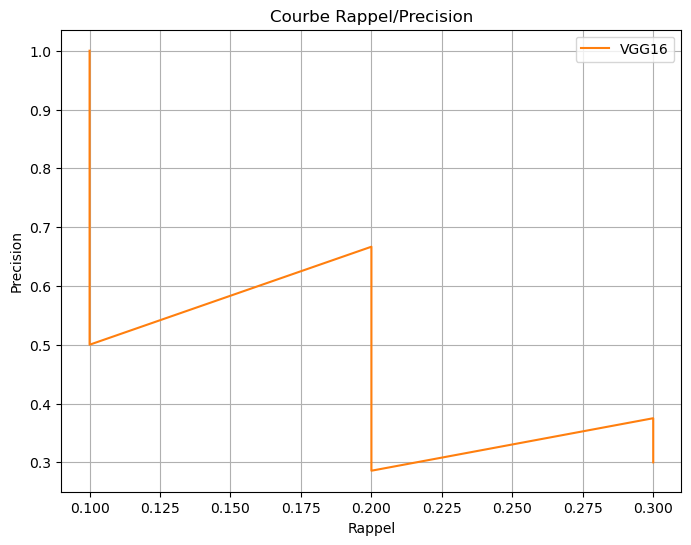

In [16]:
Display_RP("1_3_chiens_Chihuahua_1264RP.txt")

In [44]:
#Mr GPT
# # 1. Charger modèle pré-entraîné
# model = models.vgg16(pretrained=True)
# num_classes = 24

# # 2. Remplacer le classifier
# model.classifier[6] = nn.Linear(4096, num_classes)

# # 3. Optionnel : figer les premières couches
# for param in model.features.parameters():
#     param.requires_grad = False

# # 4. Préparer les données
# transform = transforms.Compose([
#     transforms.Resize((224, 224)),
#     transforms.ToTensor(),
# ])

# train_dataset = ImageFolder(root="/content/MIR_DATASETS_B/MIR_DATASETS_B", transform=transform)
# train_loader = DataLoader(train_dataset, batch_size=32, shuffle=True)

# # 5. Entraînement
# device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
# model.to(device)
# model.train()

# optimizer = torch.optim.Adam(model.parameters(), lr=0.0001)
# criterion = nn.CrossEntropyLoss()

# for epoch in range(5):  # adapte le nombre d'époques
#     running_loss = 0.0
#     for images, labels in train_loader:
#         images, labels = images.to(device), labels.to(device)

#         optimizer.zero_grad()
#         outputs = model(images)
#         loss = criterion(outputs, labels)
#         loss.backward()
#         optimizer.step()

#         running_loss += loss.item()
#     print(f"Epoch {epoch+1}, Loss: {running_loss:.4f}")

In [45]:
# from sklearn.metrics import accuracy_score

# model.eval()
# all_preds, all_labels = [], []
# with torch.no_grad():
#     for images, labels in val_loader:
#         images, labels = images.to(device), labels.to(device)
#         outputs = model(images)
#         _, preds = torch.max(outputs, 1)
#         all_preds.extend(preds.cpu().numpy())
#         all_labels.extend(labels.cpu().numpy())

# print("Accuracy:", accuracy_score(all_labels, all_preds))


## partie text

In [63]:
from sentence_transformers import SentenceTransformer
import json

# Open and load the JSON file
with open('captions_MIR_DATASETS_B.json', 'r') as f:
    text_dict = json.load(f)

# Remove all keys containing "araignees" from the dictionary
keys_to_remove = [key for key in text_dict if "araignees" in key]
for key in keys_to_remove:
    text_dict.pop(key)


model_text = SentenceTransformer('sentence-transformers/all-MiniLM-L6-v2') #import le modele

text_features_dict = {} #va créer un dico avec les embeding

for image_name, description in text_dict.items(): #repasse pour chaque elem du dico text
    embedding = model_text.encode(description) #encode juste le texte
    text_features_dict[image_name] = embedding  #ajoute dane le nouveau dico


text_descriptor_folder = "text_descriptor"
os.makedirs(text_descriptor_folder, exist_ok=True)

for key, embedding in text_features_dict.items():
    # Create subfolders according to the key path
    subfolder = os.path.join(text_descriptor_folder, os.path.dirname(key))
    os.makedirs(subfolder, exist_ok=True)
    filename = os.path.basename(key).removesuffix(".jpg") + ".npy"
    filepath = os.path.join(subfolder, filename)
    np.save(filepath, embedding)

[('chiens/Chihuahua/1_3_chiens_Chihuahua_1384.jpg', 1.0875652), ('chiens/Labrador retriever/1_1_chiens_Labradorretriever_1082.jpg', 1.0875652), ('chiens/Siberian husky/1_0_chiens_Siberianhusky_945.jpg', 1.0875652), ('chiens/boxer/1_2_chiens_boxer_1227.jpg', 1.0875652), ('chiens/Labrador retriever/1_1_chiens_Labradorretriever_1021.jpg', 1.092696), ('chiens/Labrador retriever/1_1_chiens_Labradorretriever_976.jpg', 1.0933173), ('chiens/Labrador retriever/1_1_chiens_Labradorretriever_1079.jpg', 1.0967299), ('chiens/boxer/1_2_chiens_boxer_1190.jpg', 1.0978298), ('chiens/Rottweiler/1_5_chiens_Rottweiler_1671.jpg', 1.0998352), ('chiens/Rottweiler/1_5_chiens_Rottweiler_1631.jpg', 1.0998352)]
{'1_3_chiens_Chihuahua_1264.txt': 'MIR_DATASETS_B/MIR_DATASETS_B\\chiens\\Chihuahua\\1_3_chiens_Chihuahua_1264.jpg', '1_3_chiens_Chihuahua_1265.txt': 'MIR_DATASETS_B/MIR_DATASETS_B\\chiens\\Chihuahua\\1_3_chiens_Chihuahua_1265.jpg', '1_3_chiens_Chihuahua_1266.txt': 'MIR_DATASETS_B/MIR_DATASETS_B\\chiens\\C

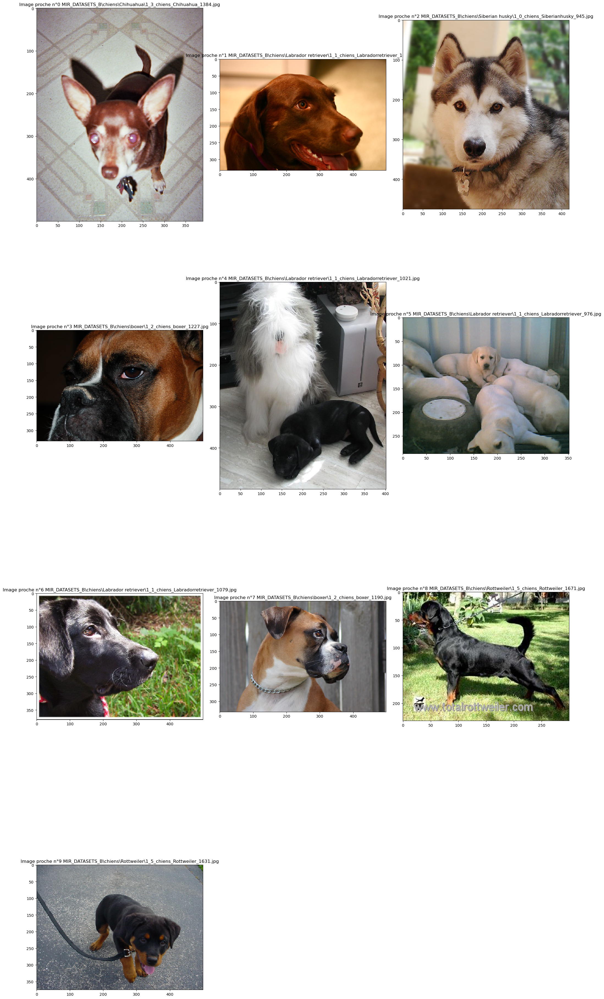

('1_3_chiens_Chihuahua_1264.jpg',
 ['MIR_DATASETS_B/MIR_DATASETS_B\\chiens\\Chihuahua\\1_3_chiens_Chihuahua_1384.jpg',
  'MIR_DATASETS_B/MIR_DATASETS_B\\chiens\\Labrador retriever\\1_1_chiens_Labradorretriever_1082.jpg',
  'MIR_DATASETS_B/MIR_DATASETS_B\\chiens\\Siberian husky\\1_0_chiens_Siberianhusky_945.jpg',
  'MIR_DATASETS_B/MIR_DATASETS_B\\chiens\\boxer\\1_2_chiens_boxer_1227.jpg',
  'MIR_DATASETS_B/MIR_DATASETS_B\\chiens\\Labrador retriever\\1_1_chiens_Labradorretriever_1021.jpg',
  'MIR_DATASETS_B/MIR_DATASETS_B\\chiens\\Labrador retriever\\1_1_chiens_Labradorretriever_976.jpg',
  'MIR_DATASETS_B/MIR_DATASETS_B\\chiens\\Labrador retriever\\1_1_chiens_Labradorretriever_1079.jpg',
  'MIR_DATASETS_B/MIR_DATASETS_B\\chiens\\boxer\\1_2_chiens_boxer_1190.jpg',
  'MIR_DATASETS_B/MIR_DATASETS_B\\chiens\\Rottweiler\\1_5_chiens_Rottweiler_1671.jpg',
  'MIR_DATASETS_B/MIR_DATASETS_B\\chiens\\Rottweiler\\1_5_chiens_Rottweiler_1631.jpg'])

In [32]:
def rechercheTexte(query, features_dict, image_dict, top=9):
    voisins = getkVoisins(features_dict, query_vector=query, k=top)
    print(voisins)
    # Récupérer les chemins des images similaires
    print(image_dict)
    nom_images_proches = [image_dict[v[0].split('/')[-1].split('.')[0]+".txt"] for v in voisins]
    # for v in voisins:
    #     img_key = v[0].replace('/', '\\')
    #     print(f"Image proche : {img_key} avec distance {v[0]}")
    #     if img_key in image_dict:   
    #         print(f"Image proche : {image_dict[img_key]} avec distance {v[1]}")
    #         nom_images_proches.append(image_dict[img_key])
        
    print(nom_images_proches)
    # Affichage des images proches
    plt.figure(figsize=(25, 50))
    plt.subplots_adjust(hspace=0.1, wspace=0.1)
    num_rows = int(math.ceil(top / 3))  # 3 subplots per row
    num_cols = min(top, 3)
    for j in range(min(top, len(nom_images_proches))):
        print(f" test {j}")
        plt.subplot(num_rows, num_cols, j + 1)
        nom_images_short = nom_images_proches[j].split("/")[-1]
        plt.imshow(imread(nom_images_proches[j]), cmap='gray', interpolation='none')
        plt.title(f"Image proche n°{j} {nom_images_short}")

    plt.show()
    return nom_image_requete, nom_images_proches


querry_text = "rottweiler"
querry_vector = model_text.encode(querry_text) #encode juste le texte

rechercheTexte(querry_vector, text_features_dict, image_dict, top=10)

In [ ]:
with open('captions_MIR_DATASETS_B.json', 'r') as f:
    debug = json.load(f)


print(debug)


{'oiseaux/vulture/2_0_oiseaux_vulture_1888.jpg': 'a vulture in flight', 'oiseaux/vulture/2_0_oiseaux_vulture_1863.jpg': 'a bird flying in the sky', 'oiseaux/vulture/2_0_oiseaux_vulture_1877.jpg': 'a bird with a white head and a black beak', 'oiseaux/vulture/2_0_oiseaux_vulture_1876.jpg': 'a bird sitting on top of a tree branch', 'oiseaux/vulture/2_0_oiseaux_vulture_1862.jpg': 'a bird sitting on top of a wooden pole', 'oiseaux/vulture/2_0_oiseaux_vulture_1848.jpg': 'a bird with a large beak', 'oiseaux/vulture/2_0_oiseaux_vulture_1874.jpg': 'a bird is flying over a wooden fence', 'oiseaux/vulture/2_0_oiseaux_vulture_1860.jpg': 'a bird flying in the air', 'oiseaux/vulture/2_0_oiseaux_vulture_1733.jpg': 'a bird standing in the grass', 'oiseaux/vulture/2_0_oiseaux_vulture_1732.jpg': 'two vultures sitting on a branch', 'oiseaux/vulture/2_0_oiseaux_vulture_1861.jpg': 'a bird flying over a field of tall grass', 'oiseaux/vulture/2_0_oiseaux_vulture_1875.jpg': 'two black vultures on a brick wall